# Objectives Figure

This notebook provides a simple demonstration of some objectives for use in the flexible subset selection strategy for data visualization. This notebook generates Figure 2 of the paper in  figures/objectives.pdf. The random dataset generated for the example and the subsets selected can be found in data/2-objectives.

### Imports and Setup

In [1]:
# Third party
import matplotlib.pyplot as plt
import matplotlib_inline

import numpy as np
import seaborn as sns 

from sklearn.cluster import KMeans

# Local
import flexibleSubsetSelection as fss

# Initialize notebook settings
sns.set_theme() # set seaborn theme
matplotlib_inline.backend_inline.set_matplotlib_formats('svg') # vector plots
%matplotlib inline 
%load_ext autoreload
%autoreload 2

## Set 1

A first set of objectives on a 10 dimensional random dataset

In [2]:
directory = "Fig2&3-objectives" # data directory for this notebook
subsetSize = 10            # size of subset selected
verbose = False            # verbosity of solvers
seed = 123                 # random generation seed for replicability

firstDataset = fss.Dataset(randTypes="multimodal", size=(1000, 10), seed=seed)
firstDataset.save(f"{directory}/firstSetFull")

### Mean Objective

In [3]:
# Precalculate dataset means
firstDataset.preprocess(mean=fss.metric.mean)

# Create a unicriterion loss function with the mean metric and precomputation
meanLoss = fss.UniCriterion(objective = fss.objective.preserveMetric, 
                            metric = fss.metric.mean,
                            datasetMetric = firstDataset.mean)

# Create solve methods
solveWorst = fss.Solver(algorithm=fss.algorithm.worstOfRandom, loss=meanLoss)
solveBest = fss.Solver(algorithm=fss.algorithm.bestOfRandom, loss=meanLoss)
solveGreedy = fss.Solver(algorithm=fss.algorithm.greedySwap, loss=meanLoss)

# Solve for mean preserved subsets with a set size
subsetMeanWorst = solveWorst.solve(dataset = firstDataset, 
                                   subsetSize = subsetSize, 
                                   verbose = verbose)
subsetMeanWorst.save(f"{directory}/meanBest")

subsetMeanBest = solveBest.solve(dataset = firstDataset, 
                                 subsetSize = subsetSize, 
                                 verbose = verbose)
subsetMeanBest.save(f"{directory}/meanBest")

subsetMeanGreedy = solveGreedy.solve(dataset = firstDataset,  
                                     subsetSize = subsetSize, 
                                     verbose = verbose)
subsetMeanGreedy.save(f"{directory}/meanGreedy")

### Range Objective

In [4]:
# Precalculate dataset ranges
firstDataset.preprocess(range = fss.metric.range)

# Create a unicriterion loss function with the range metric and update solver
rangeLoss = fss.UniCriterion(objective = fss.objective.preserveMetric, 
                             metric = fss.metric.range,
                             datasetMetric = firstDataset.range)
solveWorst.loss = solveBest.loss = solveGreedy.loss = rangeLoss

# Solve for range preserved subsets with a set size
subsetRangeWorst = solveWorst.solve(dataset = firstDataset,  
                                    subsetSize = subsetSize, 
                                    verbose = verbose)
subsetRangeWorst.save(f"{directory}/rangeWorst")

subsetRangeBest = solveBest.solve(dataset = firstDataset,  
                                  subsetSize = subsetSize, 
                                  verbose = verbose)
subsetRangeBest.save(f"{directory}/rangeBest")

subsetRangeGreedy = solveGreedy.solve(dataset = firstDataset,  
                                      subsetSize = subsetSize, 
                                      verbose = verbose)
subsetRangeGreedy.save(f"{directory}/rangeGreedy")

### Variance Objective

In [5]:
# Precalculate the discrete coverage of the full dataset
firstDataset.preprocess(variance = fss.metric.variance)

# Create a unicriterion loss function with the variance metric and update solver
varianceLoss = fss.UniCriterion(objective = fss.objective.preserveMetric, 
                                metric = fss.metric.variance,
                                datasetMetric = firstDataset.variance)
solveWorst.loss = solveBest.loss = solveGreedy.loss = varianceLoss

# Solve for variance preserved subsets with a set size
subsetVarianceWorst = solveWorst.solve(dataset = firstDataset,  
                                       subsetSize = subsetSize, 
                                       verbose = verbose)
subsetVarianceWorst.save(f"{directory}/varianceWorst")

subsetVarianceBest = solveBest.solve(dataset = firstDataset,  
                                     subsetSize = subsetSize, 
                                     verbose = verbose)
subsetVarianceBest.save(f"{directory}/varianceBest")

subsetVarianceGreedy = solveGreedy.solve(dataset = firstDataset,  
                                         subsetSize = subsetSize, 
                                         verbose = verbose)
subsetVarianceGreedy.save(f"{directory}/varianceGreedy")

### Crossings

In [6]:
# Create a unicriterion loss function with the coverage metric and update solver
crossingsLoss = fss.UniCriterion(objective = fss.objective.pcpLineCrossings)
solveWorst.loss = solveBest.loss = solveGreedy.loss = crossingsLoss

# Solve for coverage subsets with a set size
subsetCrossingsWorst = solveWorst.solve(dataset = firstDataset,  
                                        subsetSize = subsetSize, 
                                        verbose = verbose)
subsetCrossingsWorst.save(f"{directory}/crossingsWorst")

subsetCrossingsBest = solveBest.solve(dataset = firstDataset,  
                                      subsetSize = subsetSize, 
                                      verbose = verbose)
subsetCrossingsBest.save(f"{directory}/crossingsBest")

subsetCrossingsGreedy = solveGreedy.solve(dataset = firstDataset,  
                                          subsetSize = subsetSize, 
                                          verbose = verbose)
subsetCrossingsGreedy.save(f"{directory}/crossingsGreedy")

### Coverage

In [7]:
# Bin and one hot encode the dataset for discretization
firstDataset.discretize(bins=6)
firstDataset.encode()

# Create a unicriterion loss function with the coverage metric and update solver
coverageLoss = fss.UniCriterion(objective = fss.objective.discreteCoverage)
solveWorst.loss = solveBest.loss = solveGreedy.loss = coverageLoss

# Solve for coverage subsets with a set size
subsetCoverageWorst = solveWorst.solve(dataset = firstDataset,  
                                       subsetSize = subsetSize, 
                                       verbose = verbose)
subsetCoverageWorst.save(f"{directory}/coverageWorst")

subsetCoverageBest = solveBest.solve(dataset = firstDataset,  
                                     subsetSize = subsetSize, 
                                     verbose = verbose)
subsetCoverageBest.save(f"{directory}/coverageBest")

subsetCoverageGreedy = solveGreedy.solve(dataset = firstDataset,  
                                         subsetSize = subsetSize, 
                                         verbose = verbose)
subsetCoverageGreedy.save(f"{directory}/coverageGreedy")
subsetCoverageWorst.loss += 60
subsetCoverageBest.loss += 60
subsetCoverageGreedy.loss += 60

### Distribution

In [8]:
# Precalculate the discrete distribution of the full dataset
firstDataset.preprocess(distribution = fss.metric.discreteDistribution)

# Create a unicriterion loss function with the coverage metric and preprocess
distributionLoss = fss.UniCriterion(objective = fss.objective.preserveMetric,
                                     metric = fss.metric.discreteDistribution,
                                     datasetMetric = firstDataset.distribution)
solveWorst.loss = solveBest.loss = solveGreedy.loss = distributionLoss

# Solve for coverage subsets with a set size
subsetDistributionWorst = solveWorst.solve(dataset = firstDataset,  
                                   subsetSize = subsetSize, 
                                   verbose = verbose)
subsetDistributionWorst.save(f"{directory}/distributionWorst")

subsetDistributionBest = solveBest.solve(dataset = firstDataset,  
                                  subsetSize = subsetSize, 
                                  verbose = verbose)
subsetDistributionBest.save(f"{directory}/distributionBest")

subsetDistributionGreedy = solveGreedy.solve(dataset = firstDataset,  
                            subsetSize = subsetSize, 
                            verbose = verbose)
subsetDistributionGreedy.save(f"{directory}/distributionGreedy")

### Plot

In [9]:
def computeCoverage(df_data, df_subset, numBins):
    covered = []
    notCovered = []
    for col in df_data.columns:
        bins = np.linspace(df_data[col].min(), df_data[col].max(), num=numBins+1)
        bin_centers = (bins[:-1] + bins[1:]) / 2.0
        is_covered = np.zeros(len(bin_centers), dtype=bool)
        for _, row in df_subset.iterrows():
            value = row[col]
            bin_index = np.digitize(value, bins) - 1
            if bin_index >= 0 and bin_index < len(bin_centers):
                is_covered[bin_index] = True
        covered.append(bin_centers[is_covered])
        notCovered.append(bin_centers[~is_covered])

    return covered, notCovered

In [10]:
def computeCrossings(numFeatures, df_subset):
    """Returns the locations of crossings in each feature of the subset"""
    subset = df_subset.values  # Convert DataFrame subset to numpy array
    crossings = []

    for i in range(numFeatures - 1):
        for j in range(subset.shape[0]):
            for k in range(j + 1, subset.shape[0]):  # Ensure k > j to avoid redundant checks
                if subset[j, i] <= subset[k, i] and subset[j, i + 1] >= subset[k, i + 1]:
                    x1, y1 = i, subset[j, i]
                    x2, y2 = i + 1, subset[j, i + 1]
                    x3, y3 = i, subset[k, i]
                    x4, y4 = i + 1, subset[k, i + 1]

                    # Calculate intersection point using parametric equations of lines
                    if x1 != x2 and x3 != x4:  # Ensure lines are not vertical
                        m1 = (y2 - y1) / (x2 - x1)
                        m2 = (y4 - y3) / (x4 - x3)

                        if m1 != m2:  # Ensure lines are not parallel
                            x_intersect = (m1 * x1 - y1 - m2 * x3 + y3) / (m1 - m2)
                            y_intersect = m1 * (x_intersect - x1) + y1
                            crossings.append((x_intersect, y_intersect))

    return crossings

In [11]:
# Initialize color and plot settings
color = fss.plot.Color()
fss.plot.initialize(color)

nrows = 6
ncols = 4
titleSize = 20
subtitleSize = 16

ylabels = ["Mean", "Range", "Variance", "Discrete\nCoverage", "Line\nCrossings",
           "Discrete\nDistribution"]
titles = ["Worst of Random", "Best of Random", "Greedy Algorithm", "Loss"]
loss_labels = ['Worst of Random', 'Best of Random', 'Greedy Algorithm']

subsets = [[subsetMeanWorst, subsetMeanBest, subsetMeanGreedy, None],
           [subsetRangeWorst, subsetRangeBest, subsetRangeGreedy, None],
           [subsetVarianceWorst, subsetVarianceBest, subsetVarianceGreedy, None],
           [subsetCoverageWorst, subsetCoverageBest, subsetCoverageGreedy, None],
           [subsetCrossingsWorst, subsetCrossingsBest, subsetCrossingsGreedy, None],
           [subsetDistributionWorst, subsetDistributionBest, subsetDistributionGreedy, None]]
metrics = [[[fss.metric.mean], [fss.metric.mean], [fss.metric.mean], ["loss"]],
           [[fss.metric.min, fss.metric.max], [fss.metric.min, fss.metric.max], [fss.metric.min, fss.metric.max], ["loss"]],
           [[fss.metric.positiveVariance, fss.metric.negativeVariance], [fss.metric.positiveVariance, fss.metric.negativeVariance], [fss.metric.positiveVariance, fss.metric.negativeVariance], ["loss"]],
           [[computeCoverage], [computeCoverage], [computeCoverage], ["loss"]],
           [[computeCrossings], [computeCrossings], [computeCrossings], ["loss"]],
           [["distribution"], ["distribution"], ["distribution"], ["loss"]]]

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 10), 
                        gridspec_kw={'width_ratios': [1, 1, 1, 0.25]})

for i in range(nrows):  # Loop through rows
    for j in range(ncols):  # Loop through columns
        ax = axs[i, j]
        if i == 0: # Add titles to top row
            ax.set_title(titles[j], fontsize=subtitleSize)
        if j == 0: # Add titles to first column
            ax.set_ylabel(ylabels[i], fontsize=subtitleSize)
        if j < 3:  # Put parallel coordinate plots in the first 3 columns
            if metrics[i][j] != ["distribution"]:
                fss.plot.parallelCoordinates(ax=ax, 
                                         color=color, 
                                         dataset=firstDataset, 
                                         subset=subsets[i][j])
            else:
                fss.plot.histogram(ax, 
                                   color, 
                                   dataset=firstDataset, 
                                   subset=subsets[i][j])

            ax.grid(visible=True)
            ax.legend().set_visible(False)

            for metric in metrics[i][j]:
                if metric == computeCoverage:
                    covered, notCovered = metric(firstDataset.data, 
                                                 subsets[i][j].data, 
                                                 6)
                    fss.plot.errorMarkers(ax,
                                      range(len(firstDataset.data.columns)),
                                      notCovered,
                                      color.palette["orange"],
                                      marker1='o',
                                      vals2=covered,
                                      color2="black",
                                      marker2='.')
                elif metric == computeCrossings:
                    numFeatures = len(subsets[i][j].data.columns)
                    crossings = computeCrossings(numFeatures, 
                                                 subsets[i][j].data)
                    for crossing in crossings:
                        ax.scatter(crossing[0], 
                                   crossing[1], 
                                   color=color.palette["orange"], 
                                   marker='o',
                                   s=8, 
                                   zorder=4)
                elif metric == "distribution":
                    continue
                else:
                    fss.plot.errorBar(ax, 
                                  range(len(firstDataset.data.columns)),
                                  metric(firstDataset.data), 
                                  metric(subsets[i][j].data), 
                                  color=color.palette["orange"])
        else:  # Put bar charts of losses in the fourth column
            loss_values = [subsets[i][0].loss, 
                           subsets[i][1].loss, 
                           subsets[i][2].loss]
            ax.bar(loss_labels, loss_values, color=[color.palette["green"]])
            ax.set_xticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])

plt.savefig(f"../figures/{directory}/objectives-1.pdf", bbox_inches="tight")

/var/folders/rs/t3f52g4s2014fhrfb0b0fw8h0000gs/T/ipykernel_69842/893983072.py:51: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
/var/folders/rs/t3f52g4s2014fhrfb0b0fw8h0000gs/T/ipykernel_69842/893983072.py:51: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)
/var/folders/rs/t3f52g4s2014fhrfb0b0fw8h0000gs/T/ipykernel_69842/893983072.py:51: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().set_visible(False)


## Set 2

A second set of objectives on a 2D random dataset to display on 2D scatterplots

In [12]:
subsetSize = 10            # size of subset selected
verbose = False            # verbosity of solvers
seed = 123                 # random generation seed for replicability

secondDataset = fss.Dataset(randTypes="blobs", size=(1000, 2), seed=seed)
secondDataset.save(f"{directory}/secondSetFull")

### Distinctiveness

In [21]:
# Create a unicriterion loss function with the distinctiveness objective
secondDataset.preprocess(distances = fss.metric.distanceMatrix)
distinctLoss = fss.UniCriterion(objective = fss.objective.distinctiveness, 
                                solveArray = "distances",
                                selectBy = "matrix")

# Create solve methods
solveWorst = fss.Solver(algorithm=fss.algorithm.worstOfRandom, loss=distinctLoss)
solveBest = fss.Solver(algorithm=fss.algorithm.bestOfRandom, loss=distinctLoss)
solveGreedy = fss.Solver(algorithm=fss.algorithm.greedySwap, loss=distinctLoss)

# Solve for coverage subsets with a set size
subsetDistinctivenessWorst = solveWorst.solve(dataset = secondDataset,  
                                              subsetSize = subsetSize, 
                                              verbose = verbose)
subsetDistinctivenessWorst.save(f"{directory}/distinctivenessWorst")

subsetDistinctivenessBest = solveBest.solve(dataset = secondDataset,  
                                            subsetSize = subsetSize, 
                                            verbose = verbose)
subsetDistinctivenessBest.save(f"{directory}/distinctivenessBest")

subsetDistinctivenessGreedy = solveGreedy.solve(dataset = secondDataset,  
                                                subsetSize = subsetSize, 
                                                verbose = verbose)
subsetDistinctivenessGreedy.save(f"{directory}/distinctivenessGreedy")

subsetDistinctivenessWorst.loss += 60
subsetDistinctivenessBest.loss += 60
subsetDistinctivenessGreedy.loss += 60

### Spread

In [33]:
# Create a unicriterion loss function with the spread objective
spreadLoss = fss.UniCriterion(objective = fss.objective.spread, 
                              solveArray = "distances",
                              selectBy = "matrix")
solveWorst.loss = solveBest.loss = solveGreedy.loss = spreadLoss

# Solve for coverage subsets with a set size
subsetSpreadWorst = solveWorst.solve(dataset = secondDataset,  
                                     subsetSize = subsetSize, 
                                     verbose = verbose)
subsetSpreadWorst.save(f"{directory}/spreadWorst")

subsetSpreadBest = solveBest.solve(dataset = secondDataset,  
                                   subsetSize = subsetSize, 
                                   verbose = verbose)
subsetSpreadBest.save(f"{directory}/spreadBest")

subsetSpreadGreedy = solveGreedy.solve(dataset = secondDataset,  
                                       subsetSize = subsetSize, 
                                       verbose = verbose)
subsetSpreadGreedy.save(f"{directory}/spreadGreedy")

subsetSpreadWorst.loss += 1000
subsetSpreadBest.loss += 1000
subsetSpreadGreedy.loss += 1000

### Clusters

In [15]:
# Precalculate the cluster metric on the full dataset
secondDataset.preprocess(clusterCenters=(fss.metric.clusterCenters, {'k': 5}))

# Create a unicriterion loss function with the cluster objective
clusterLoss = fss.UniCriterion(objective = fss.objective.clusterCenters, 
                               clusterCenters = secondDataset.clusterCenters)
solveWorst.loss = solveBest.loss = solveGreedy.loss = clusterLoss

# Solve for coverage subsets with a set size
subsetClusterWorst = solveWorst.solve(dataset = secondDataset,  
                                   subsetSize = subsetSize, 
                                   verbose = verbose)
subsetClusterWorst.save(f"{directory}/clusterWorst")

subsetClusterBest = solveBest.solve(dataset = secondDataset,  
                                  subsetSize = subsetSize, 
                                  verbose = verbose)
subsetClusterBest.save(f"{directory}/clusterBest")

subsetClusterGreedy = solveGreedy.solve(dataset = secondDataset,  
                            subsetSize = subsetSize, 
                            verbose = verbose)
subsetClusterGreedy.save(f"{directory}/clusterGreedy")

### Plot

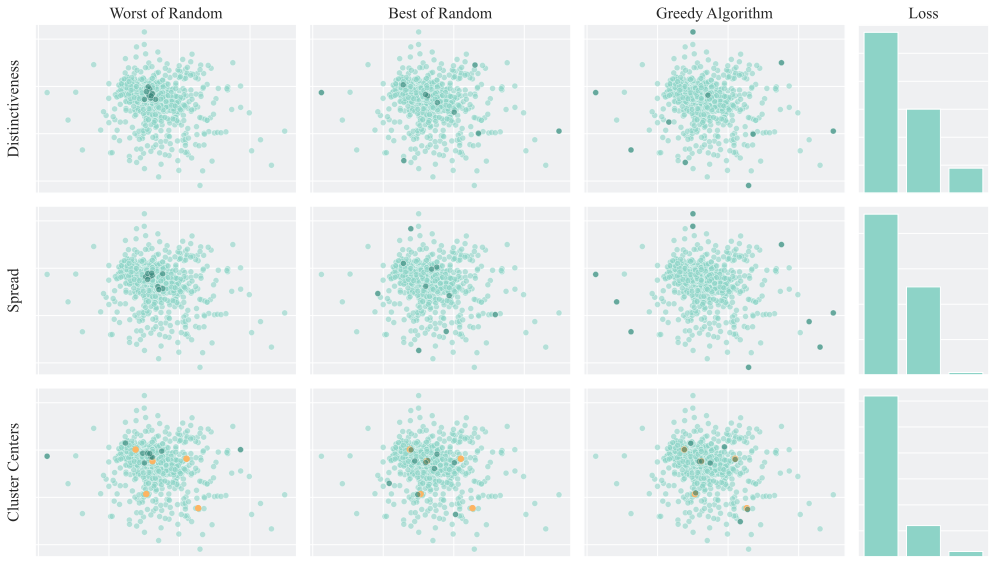

In [37]:
nrows = 3
ncols = 4
titleSize = 20
subtitleSize = 16

ylabels = ["Distinctiveness", "Spread", "Cluster Centers"]
titles = ["Worst of Random", "Best of Random", "Greedy Algorithm", "Loss"]
subsets = [[subsetDistinctivenessWorst, subsetDistinctivenessBest, subsetDistinctivenessGreedy, None],
           [subsetSpreadWorst, subsetSpreadBest, subsetSpreadGreedy, None],
           [subsetClusterWorst, subsetClusterBest, subsetClusterGreedy, None]]
           
# Adjust the figsize to make room for the plots
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 8), 
                        gridspec_kw={'width_ratios': [1, 1, 1, 0.5]})

for i in range(nrows):  # Loop through rows
    for j in range(ncols):  # Loop through columns
        ax = axs[i, j]
        if i == 0: # Add titles to top row
            ax.set_title(titles[j], fontsize=subtitleSize)
        if j < 3:
            fss.plot.scatter(ax = ax, 
                        color = color, 
                        dataset = secondDataset, 
                        subset = subsets[i][j],
                        alpha = 0.6)
            if i == 2:           
                ax.scatter(secondDataset.clusterCenters[:, 0], 
                           secondDataset.clusterCenters[:, 1], 
                           marker='o', 
                           color=color.palette["yellow"],
                           s=30,
                           zorder=3)
        else:
            loss_values = [subsets[i][0].loss, 
                           subsets[i][1].loss, 
                           subsets[i][2].loss]
            ax.bar(loss_labels, loss_values, color=[color.palette["green"]])
            ax.set_xticks([])
        if j == 0: # Add titles to first column
            ax.set_ylabel(ylabels[i], fontsize=subtitleSize)
        else:
            ax.set_ylabel(None)
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_xlabel(None)


plt.savefig(f"../figures/{directory}/objectives-2.pdf", bbox_inches="tight")